<a href="https://colab.research.google.com/github/VladYourich/Face_reco_for_LizaAlert/blob/main/Vlad_Kosmylev/VladKosmylev_Face_recognition_LA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install face_recognition sqlalchemy

# Настройки

In [2]:
import numpy as np

from sqlalchemy import create_engine, Column, Integer, String, BLOB, ForeignKey
from sqlalchemy.orm import declarative_base, relationship, sessionmaker
from sqlalchemy.types import TypeDecorator, PickleType
import matplotlib.pyplot as plt

import pickle
import face_recognition

СALLSIGN_ID     = {}
СALLSIGN_NAME   = {}
VECTORS         = {}

In [3]:
dburl = 'https://drive.google.com/file/d/1gESdeTtOF_T70Ol7BKL1qLoQEiSEW11w/view?usp=sharing' # la.db
!gdown --id '1gESdeTtOF_T70Ol7BKL1qLoQEiSEW11w'
group_img_url = 'https://drive.google.com/file/d/1UVt8YXtz8J9Wf5UKBSWyYN-S-jaeE6p7/view?usp=sharing'
!gdown --id '1UVt8YXtz8J9Wf5UKBSWyYN-S-jaeE6p7'
one_img_url = 'https://drive.google.com/file/d/1Q5mnm6Ls2qiT6d_L1IPVbOojiEW8GGy7/view?usp=sharing'
!gdown --id '1Q5mnm6Ls2qiT6d_L1IPVbOojiEW8GGy7'
#https://drive.google.com/file/d/1Y4AH8ARsZbu1YPpNmbFXAGQq-T7uy_6_/view?usp=sharing

one_img_url = 'https://drive.google.com/file/d/1Y4AH8ARsZbu1YPpNmbFXAGQq-T7uy_6_/view?usp=sharing'
!gdown --id '1Y4AH8ARsZbu1YPpNmbFXAGQq-T7uy_6_'
# https://drive.google.com/file/d/1NxyqVUS4dmzKxNyCfbmbMqUN_G39Xlns/view?usp=sharing
!gdown --id '1NxyqVUS4dmzKxNyCfbmbMqUN_G39Xlns'
# https://drive.google.com/file/d/1tW1fmquxpBt4xKlwjCdiC7s0K_MyVw5q/view?usp=sharing
!gdown --id '1tW1fmquxpBt4xKlwjCdiC7s0K_MyVw5q'
#https://drive.google.com/file/d/14Jwu3mypLeA4OwQI9xo68XEj21JLSpur/view?usp=sharing
!gdown --id '14Jwu3mypLeA4OwQI9xo68XEj21JLSpur'

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1gESdeTtOF_T70Ol7BKL1qLoQEiSEW11w
To: /content/la.db
100% 287k/287k [00:00<00:00, 88.3MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1UVt8YXtz8J9Wf5UKBSWyYN-S-jaeE6p7
To: /content/photo_1674@10-06-2023_13-11-13.jpg
100% 535k/535k [00:00<00:00, 98.4MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.

In [4]:
#( sqlalchemy
Base = declarative_base()

class PickleTypeDecorator(TypeDecorator):
    impl = BLOB
    cache_ok = False
    def process_bind_param(self, value, dialect):
        if value is not None:
            return pickle.dumps(value)

    def process_result_value(self, value, dialect):
        if value is not None:
            return pickle.loads(value)

class Callsign(Base):
    __tablename__ = 'callsign'

    id = Column(Integer, primary_key=True)
    callname = Column(String, unique=True, nullable=False)

class Vector(Base):
    __tablename__ = 'vectors'

    id = Column(Integer, primary_key=True)
    vector = Column(PickleTypeDecorator)
    #vector = Column(BLOB, nullable=False)
    #img = Column(BLOB, unique=True, nullable=True)
    call_id = Column(Integer, ForeignKey('callsign.id'))
    call = relationship('Callsign', back_populates='vectors')

Callsign.vectors = relationship('Vector', order_by=Vector.call_id, back_populates='call')

# Создание базы данных
Base = declarative_base()
engine = create_engine('sqlite:///la.db', echo=False)
Base.metadata.create_all(bind=engine)

class PickleTypeDecorator(TypeDecorator):
    impl = BLOB

    def process_bind_param(self, value, dialect):
        if value is not None:
            return pickle.dumps(value)

    def process_result_value(self, value, dialect):
        if value is not None:
            return pickle.loads(value)

def sess():
    # Создание сессии для работы с базой данных
    Session = sessionmaker(bind=engine)
    return Session()

def add_vector(id, callvector): #, callname

    ses = sess()

    # Добавление записей в таблицы
    #call = Callsign(callname=callname)
    vector = Vector(call_id=id, vector=callvector) #, call=call

    ses.add_all([vector]) #call,
    ses.commit()

def get_vectors(callid) -> list:
    # Запрос к базе для получения списка значений vector с фильтром по callname
    #global СALLSIGN_ID
    ses = sess()

    vectors_for_callname = (
        ses.query(Vector.vector)
        #.join(Vector.call)
        .filter(Vector.call_id == callid)
        .all()
    ) # выводит во внутреннем формате query
    # переводим в формат numpy.array
    list_vec = []
    for i in vectors_for_callname:
        qq = i[0][0]
        list_vec.append(qq)
    #print(f'Vectors for callname {СALLSIGN_ID[callid]}: {vectors_for_callname}')
    return list_vec

def get_id_for_calname(callname) -> int:
    ses = sess()
    # Запрос к базе для получения получения всех позывных call_id
    result = (ses.query(Callsign.id).filter(Callsign.callname == callname).one())
    return result.id
#) sqlalchemy

In [5]:
def get_all_calnames():
    """
    Retrieves all call names from the database and assigns them to global variables.
    Returns:
        None
    """
    global СALLSIGN_ID, СALLSIGN_NAME
    ses = sess()
    # Запрос к базе для получения всех позывных call_id

    result = (ses.query(Callsign.id, Callsign.callname).all())
    result_id       = {callname: id for id, callname in result}
    result_name     = {id:callname for id, callname in result}
    СALLSIGN_ID     = result_id
    СALLSIGN_NAME   = result_name
    #return result_id, result_name

def get_all_vectors() -> dict:
    vec = {}
    for name, id in СALLSIGN_ID.items():
        vec[name] = get_vectors(id)
    return vec

get_all_calnames()
VECTORS = get_all_vectors()  # словарь со Всеми векторами всех поисковиков
#) enveronments


In [6]:
#( face
class Faces_Recognition():
    img = None  # str - путь к файлу
    jit = 1
    model = "large"  # "small"
    loc_model = 'cnn' # 'hog'- for CPU, 'cnn' - for GPU
    array_img = []
    bbox = []
    vector = []
    tolerance = 0.6
    number_of_times_to_upsample = 1
    accuracy = 0.5
    def __init__(self, img):
        if type(img) == str:
            self.img = img
            self.array_img = self.get_array()
        elif type(img) == np.ndarray:
            self.array_img = img

    def get_array(self):
        self.array_img = face_recognition.load_image_file(self.img)
        return self.array_img

    def get_bbox(self):
        self.bbox = face_recognition.face_locations(self.array_img, model=self.loc_model)
        return self.bbox

    def get_vector(self):
        self.vector = face_recognition.face_encodings(
            face_image=self.array_img,
            known_face_locations=self.bbox,
            num_jitters=self.jit,
            model=self.model)
        return self.vector

    def convert_bbox(top, right, bottom, left) -> list:
        '''
        return [x_цента, у_центра, ширина, высота]
        '''
        width = right - left
        height = bottom - top
        center_x = left + width / 2
        center_y = top + height / 2
        return [center_x,center_y,width,height]

    def _normalize_rez(self,rez) -> dict:
        keys_to_remove = []

        for key, value in rez.items():
            sublist = value[1]
            subvalue = value[2]

            # Проверяем, есть ли такое значение sublist в оставшихся элементах словаря
            for other_key, other_value in rez.items():
                if other_key != key:
                    if other_value[1] == sublist and other_value[2] > subvalue:
                        # Если находим такое же sublist с большим subvalue, добавляем ключ для удаления
                        keys_to_remove.append(key)
                        #break
                    elif other_value[1] == sublist and other_value[2] < subvalue:
                        # Если находим такое же sublist с меньшим или равным subvalue, добавляем ключ другого элемента для удаления
                        keys_to_remove.append(other_key)
                        #break

        # Удаляем все ключи, указанные для удаления
        keys_to_remove = set(keys_to_remove)
        for key in keys_to_remove:
            del rez[key]

        return rez

    def recognition(self):
        global VECTORS
        if VECTORS == {}:
            VECTORS = get_all_vectors()

        self.bbox   = self.get_bbox()
        self.vector = self.get_vector()
        index_to_name = {}

        for i, (top, right, bottom, left) in enumerate(self.bbox):

            # Поиск совпадений в базе векторов
            for name, known_encodings_list in VECTORS.items():
                matches_count = 0
                # for known_encoding in known_encodings_list:
                match = face_recognition.compare_faces(known_encodings_list, self.vector[i], tolerance=self.tolerance)
                #print(len(match),match)
                for m in match:
                    if m:
                        matches_count += 1
                coincidence = matches_count/len(known_encodings_list) # Коэффициент уверенности распознавания
                if coincidence >= self.accuracy:
                    # Проверяю
                    if name in index_to_name:
                        coin = index_to_name[name][2]
                        if coin<coincidence:
                            width = right - left
                            height = bottom - top
                            center_x = int(left + width / 2)
                            center_y = int(top + height / 2)
                            bbox = [center_x,center_y,width,height]
                            bbox2= [top, right, bottom, left]
                            index_to_name[name] = [bbox, bbox2, coincidence]
                    else:
                        width = right - left
                        height = bottom - top
                        center_x = int(left + width / 2)
                        center_y = int(top + height / 2)
                        bbox = [center_x,center_y,width,height]
                        bbox2= [top, right, bottom, left]
                        index_to_name[name] = [bbox, bbox2, coincidence]

        return self._normalize_rez(index_to_name)
#) face

# Распознавание

In [10]:
def main(img_path):

    faces = Faces_Recognition(img_path)
    '''
    faces.jit - Сколько раз повторять выборку лица при расчете кодировки.
    Чем выше, тем точнее, но медленнее (т. е. 100 — в 100 раз медленнее)
    '''
    faces.jit = 10

    # 'hog'- CPU, 'cnn'- GPU
    faces.loc_model = 'cnn'

    '''
    Какое расстояние между лицами, чтобы считать его совпадающим.
    Нижний более строгий.
    Float - 0,6 — типичная лучшая производительность.
    '''
    faces.tolerance = 0.55

    '''
    param: number_of_times_to_upsample: сколько раз повышать дискретизацию изображения в поисках лиц.
    Чем выше число, тем меньше лиц будут найдены.
    '''
    faces.number_of_times_to_upsample = 1

    '''
    param: accuracy: Минимальный коэффициент уверенности в совпадении лиц.
    '''
    faces.accuracy = 0.6

    rez = faces.recognition()
    #print(rez)
    return rez

************************************************************
Якимчинк			 [[1737, 1228, 118, 118], [1169, 1796, 1287, 1678], 1.0]
ГБ			 [[2131, 1192, 118, 118], [1133, 2190, 1251, 2072], 1.0]
МиСи			 [[2444, 1328, 99, 98], [1279, 2494, 1377, 2395], 1.0]
Кеслер			 [[3277, 1276, 118, 118], [1217, 3336, 1335, 3218], 1.0]
Незабудка			 [[3648, 1288, 118, 118], [1229, 3707, 1347, 3589], 0.9090909090909091]


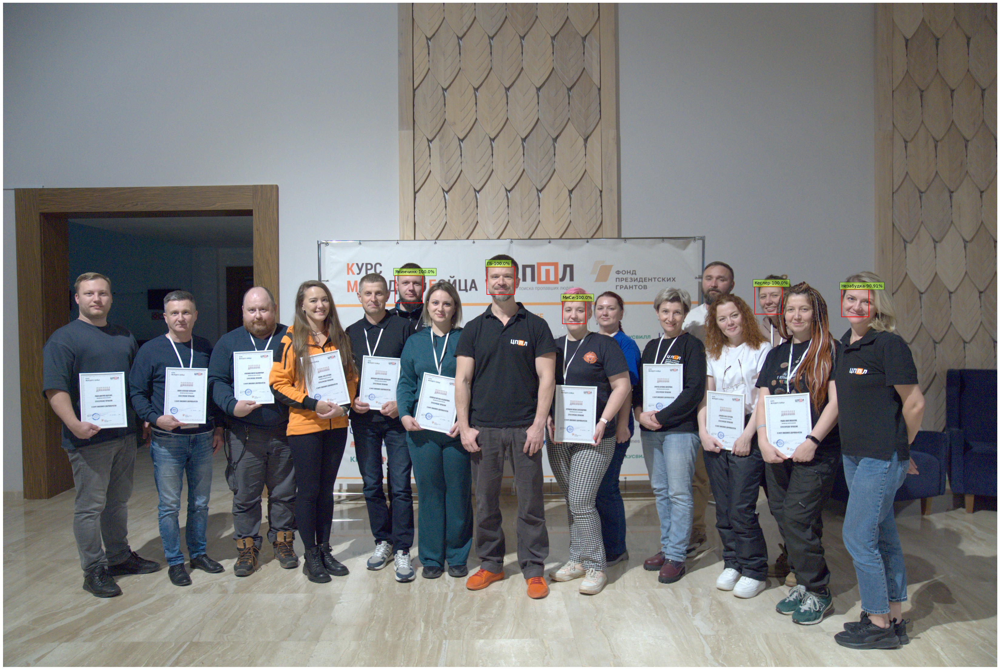

In [16]:
variant = 1
img_path = '/content/dsc09573.jpg'

if variant == 1:
    # 1 вариант подачи в экземпляр класса в str
    img = img_path
else:
    # 2 вариант подачи в экземпляр класса в numpy array
    img = face_recognition.load_image_file(img_path)

reco = main(img)
print('*'*60)
for key, value in reco.items():
    print(key, value, sep='\t\t\t ')

image = face_recognition.load_image_file(img_path)
height, width = image.shape[:2]
plt.figure(figsize=(width/100, height/100))

plt.imshow(image, extent=[0, width, height, 0])
plt.axis('off')

for name, bbox in reco.items():
    top, right, bottom, left = bbox[1]
    # Отрисовка рамок вокруг найденных лиц
    plt.plot([left, right, right, left, left], [top, top, bottom, bottom, top], color='red')
    plt.text(left, top-10, f'{name}-{round(bbox[2]*100,1)}%', fontsize=10, backgroundcolor='green', bbox=dict(facecolor='GreenYellow', alpha=0.5)) # GreenYellow

plt.show()